# Imports

In [1]:
import sys
sys.path.append('../src')
import pandas as pd
import numpy as np
import seaborn as sns
# %matplotlib notebook  # Uncomment for zoom in in 3D plot for paper

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import axes3d  

from sklearn.metrics import pairwise_distances
from sklearn.cluster import Birch

from DataSetFactory import DataSetFactory
from ClusterPlot import ClusterPlot

In [2]:
RANDOM_STATE = 42

In [3]:
# ds = DataSetFactory.get_dataset('cross-denses', random_state=RANDOM_STATE, sample=None, is_subset=False)
ds = DataSetFactory.get_dataset('cross7', random_state=RANDOM_STATE, sample=None, is_subset=False)

In [4]:
ds.feature_cols

['X', 'Y', 'Z']

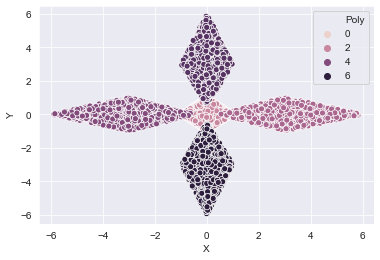

In [5]:
sns.scatterplot(x='X', y='Y', data=ds.df, hue=ds.label_col)

# 3D Plot For Paper

In [6]:
ds.df[ds.label_col].unique()

array([0, 1, 2, 3, 4, 5, 6], dtype=int64)

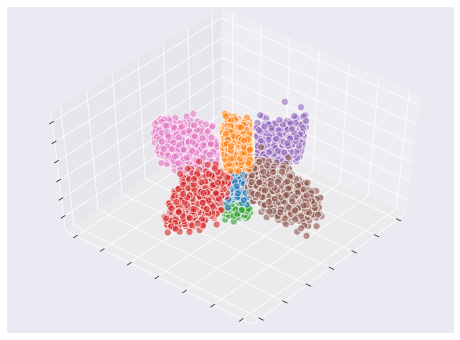

In [7]:
# %matplotlib notebook
fig = plt.figure(figsize=(8, 6))
ax = fig.add_subplot(111, projection='3d')

for l in ds.df[ds.label_col].unique():
    xs = ds.df[ds.df[ds.label_col] == l]['X']
    ys = ds.df[ds.df[ds.label_col] == l]['Y']
    zs = ds.df[ds.df[ds.label_col] == l]['Z']
    ax.scatter(xs, ys, zs, s=50, alpha=0.6, edgecolors='w')

# ax.set_xlabel('x')
# ax.set_ylabel('y')
# ax.set_zlabel('z')

# remove ticks
ax = plt.gca()
ax.xaxis.set_ticklabels([])
ax.yaxis.set_ticklabels([])
ax.zaxis.set_ticklabels([])

for line in ax.xaxis.get_ticklines():
    line.set_visible(False)
for line in ax.yaxis.get_ticklines():
    line.set_visible(False)
for line in ax.zaxis.get_ticklines():
    line.set_visible(False)

ax.view_init(elev=50, azim=40)

plt.show()

In [8]:
X = ds.df[ds.feature_cols].values
y = ds.df[ds.label_col].values

In [10]:
dist_mat = pairwise_distances(X)
threshold_candidates = np.unique(dist_mat)
threshold_candidates.shape

(28524474,)

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x0000022454F63C08>]],
      dtype=object)

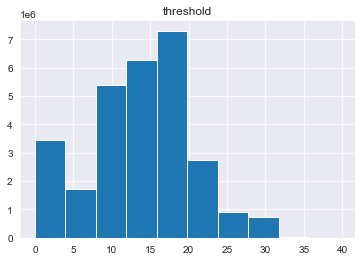

In [11]:
# for the sake of the experiment let's evaluate all of them
thresholds_df = pd.DataFrame(threshold_candidates, columns=['threshold'])
thresholds_df['num_clusters'] = np.nan
thresholds_df['num_points'] = ds.df.shape[0]
thresholds_df.hist(['threshold'])

In [12]:
# Filter only thresholds smaller than 1.5
thresholds_df_sample = thresholds_df[thresholds_df['threshold']<=10]
thresholds_df_sample = thresholds_df_sample.sample(n=200, random_state=RANDOM_STATE)
# thresholds_df_sample = thresholds_df.sample(n=200, random_state=RANDOM_STATE)

In [13]:
def get_num_clusters_birch(ds, threshold):
    num_clusters = 0
    for label in ds.df[ds.label_col].unique():
        label_data = ds.df[ds.df[ds.label_col]==label][ds.feature_cols].values
        birch = Birch(threshold=threshold, branching_factor=2, n_clusters=None)
        birch.fit(label_data)
        num_clusters += birch.subcluster_centers_.shape[0]
    return num_clusters

thresholds_df_sample['num_clusters'] = thresholds_df_sample['threshold'].transform(lambda t: get_num_clusters_birch(ds, t))
thresholds_df_sample['compression'] = thresholds_df_sample['num_points'] / thresholds_df_sample['num_clusters']

KeyboardInterrupt: 

In [ ]:
sns.lineplot(x='threshold', y='compression', data=thresholds_df_sample)
sns.lineplot(x='threshold', y='num_clusters', data=thresholds_df_sample)

# Unsupervised UMAP

In [9]:
umap_cp = ClusterPlot(dim_reduction_algo='umap',
            reduce_all_points=True,
            n_iter=1, 
            batch_size=0,
            learning_rate=0.1,
            do_animation=False,
            dataset='Cross',
            class_to_label=ds.class_to_label,
            show_fig=True,
            save_fig=True,
            random_state=RANDOM_STATE,
            show_anchors=False,
            supervised=False,
            show_points=True,
            show_inner_blobs=False,
            show_polygons=False,
            show_label_level_plots=True,
            show_anchor_level_plot=False,
            annotate_images=False,
            birch_threshold=1.55,
            transpose_low_dim=True)
print(umap_cp)

AMAP
addr:@1e4388
verbose=True
n_components=2
anchors_method='birch'
n_intra_anchors=None
birch_threshold=1.55
birch_branching_factor=None
dim_reduction_algo='umap'
supervised=False
umap_n_neighbors=15
umap_min_dist=1
tsne_perplexity=30.0
reduce_all_points=True
uniform_points_per='anchor'
k=20
proximity_k=3
self_relation=False
radius_q=None
do_relaxation=True
top_greedy=1
magnitude_step=False
n_iter=1
batch_size=0
stop_criteria=1e-05
loss_func=<function AMAP.l_inf_loss at 0x0000023E021DFDC8>
loss='Linf'
only_inter_relations=False
learning_rate=0.1
mask_sparse_subcluster=None
random_points_method='voronoi'
class_to_label={0: 'Poly0', 1: 'Poly1', 2: 'Poly2', 3: 'Poly3', 4: 'Poly4', 5: 'Poly5', 6: 'Poly6'}
random_state=42
n_jobs=None
dataset='Cross'
show_fig=True
save_fig=True
is_plotly=False
do_animation=False
use_spline=False
alpha=None
remove_outliers_k=None
douglas_peucker_tolerance=0.6
smooth_iter=3
skip_polygons_with_area=0.01
mask_relation_in_same_label=True
save_fig_every=1
show_p

finding intra class anchors using birch
UnSupervised Dim Reduction
Dim Reduction all points


C:\Users\omalkai\AppData\Local\Continuum\anaconda3_new\lib\site-packages\numba\compiler.py:602: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\..\..\AppData\Local\Continuum\anaconda3_new\lib\site-packages\umap\rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^


C:\Users\omalkai\AppData\Local\Continuum\anaconda3_new\lib\site-packages\numba\compiler.py:602: NumbaPerformanceWarning:


The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..\..\..\..\.

Starting iteration 1 loss = 0.47191011235955055


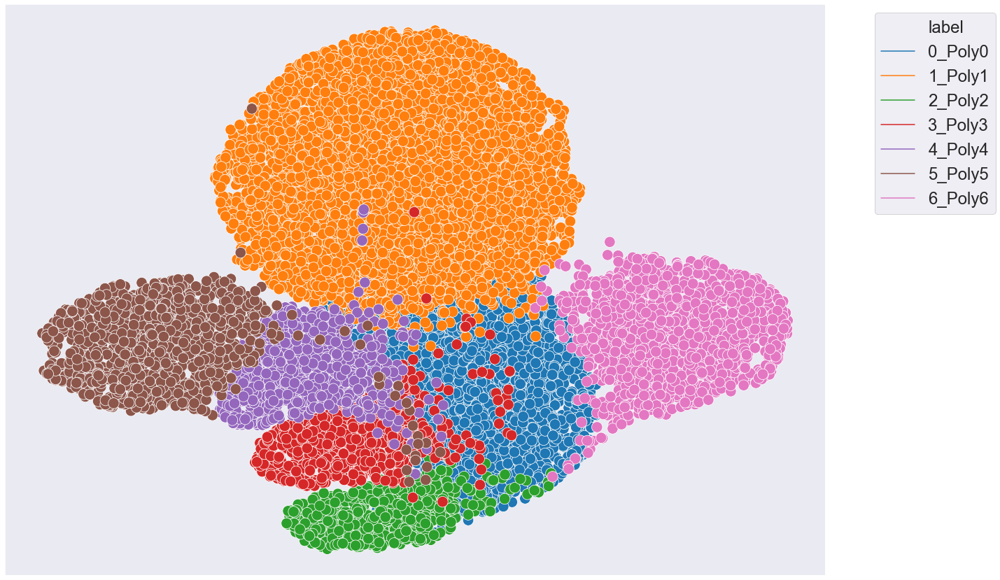

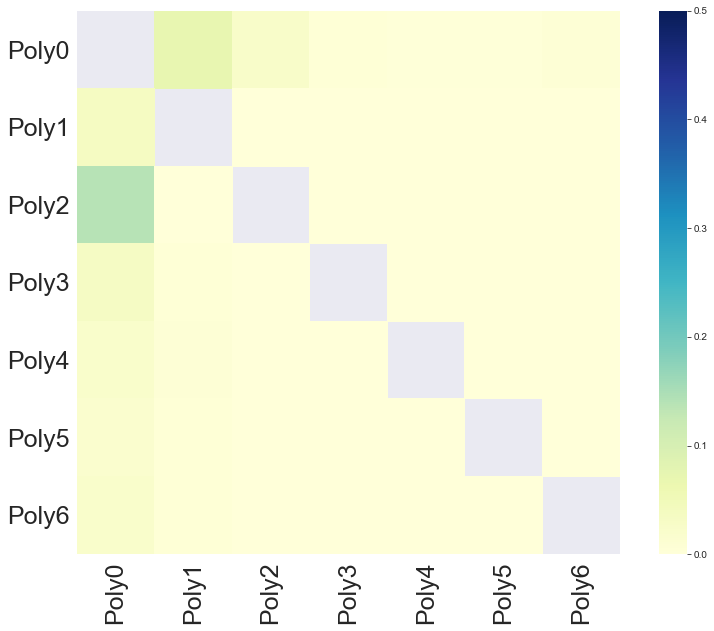

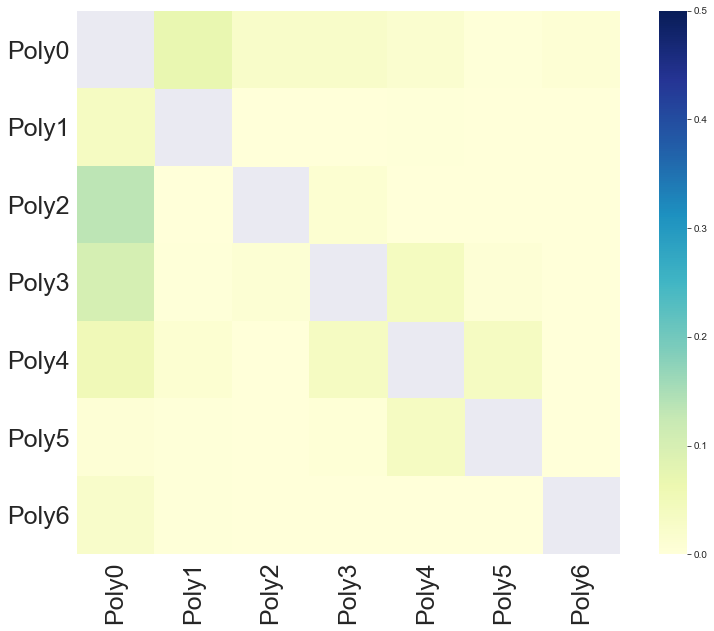

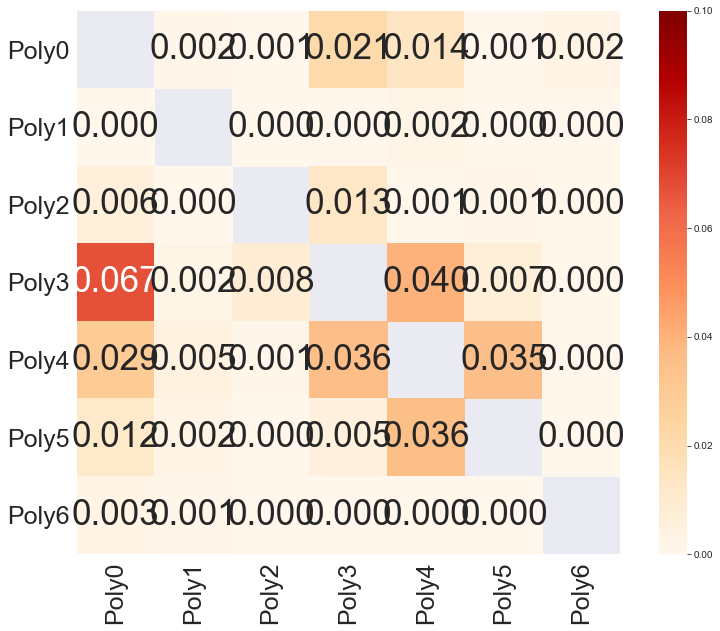

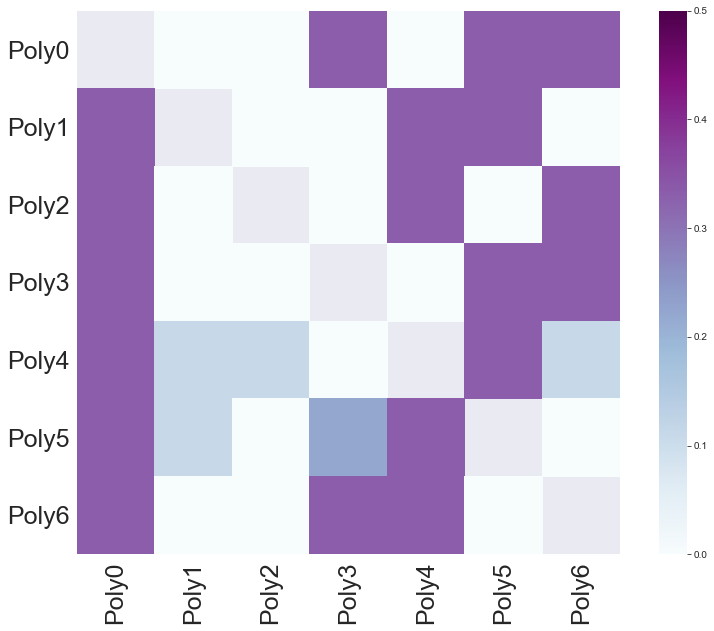

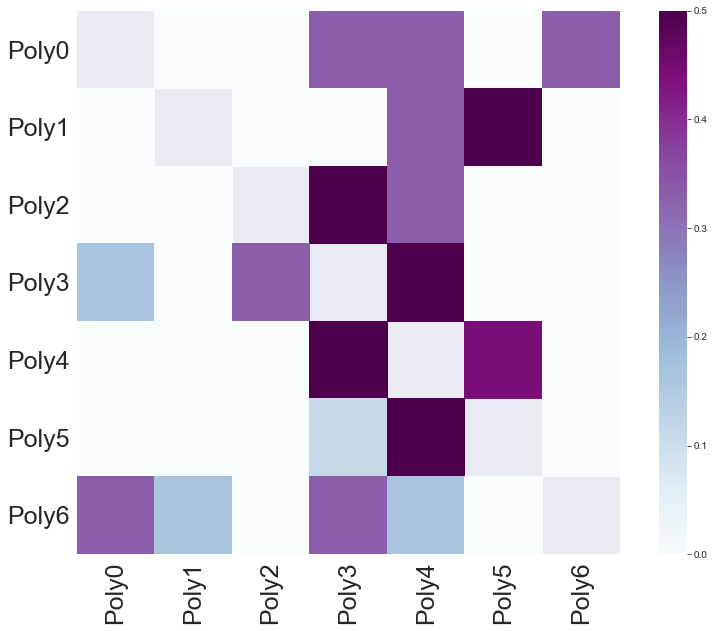

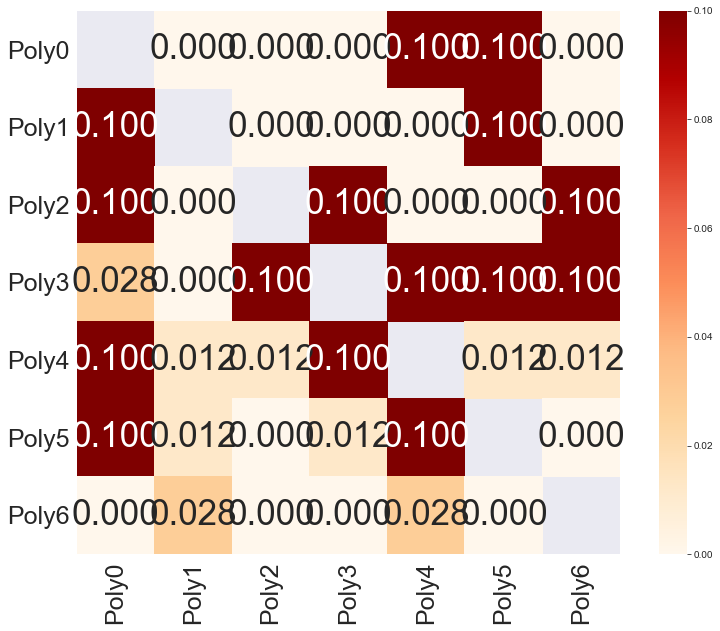

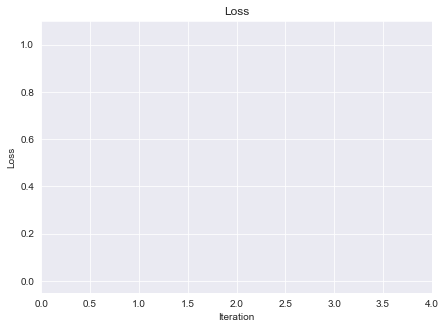

In [10]:
umap_cp_low_dim = umap_cp.fit_transform(X, y)

## Umap with Blobs

removing outliers 150 0.1
before (15005, 2)
after (14809, 2)
removing outliers 150 0.1
before (30005, 2)
after (29946, 2)
removing outliers 150 0.1
before (3005, 2)
after (2981, 2)
removing outliers 150 0.1
before (4010, 2)
after (3895, 2)
removing outliers 150 0.1
before (5015, 2)
after (4899, 2)
removing outliers 150 0.1
before (6015, 2)
after (5880, 2)
removing outliers 150 0.1
before (7010, 2)
after (6907, 2)


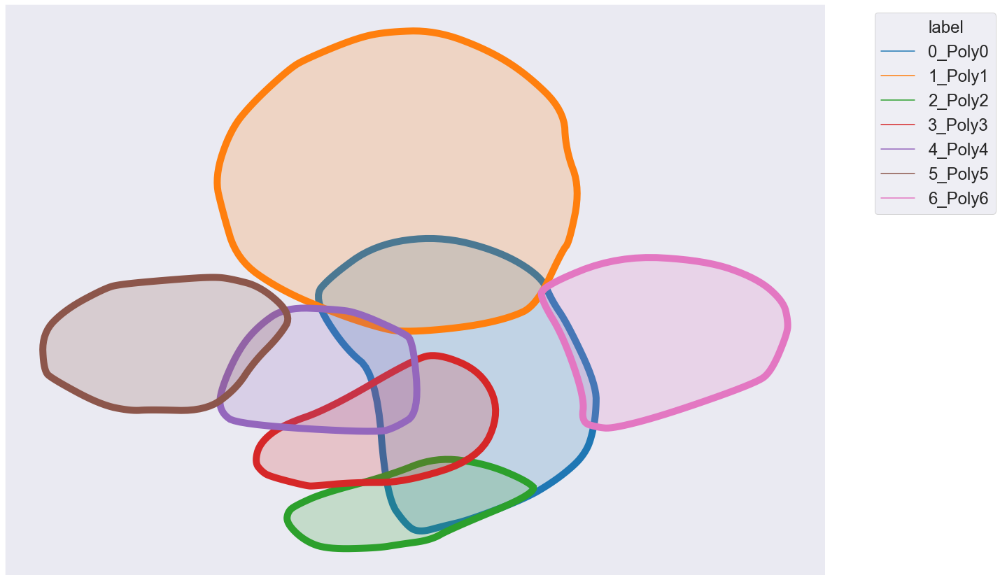

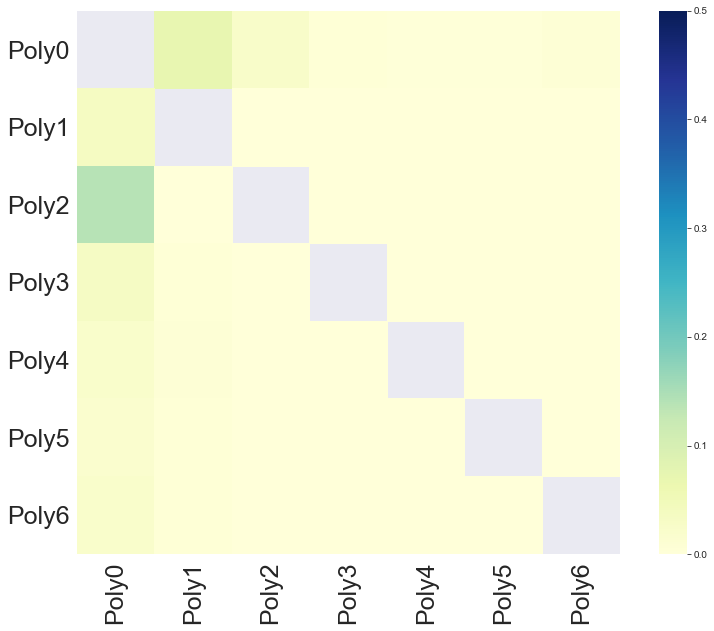

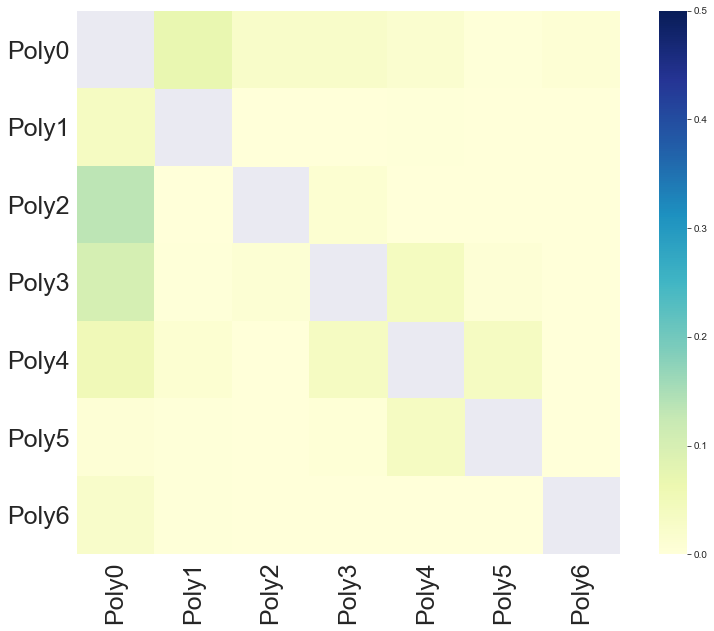

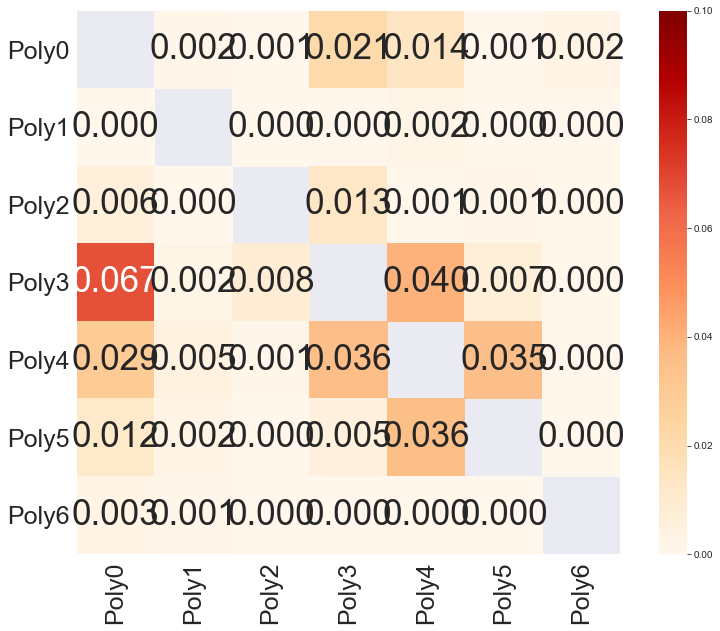

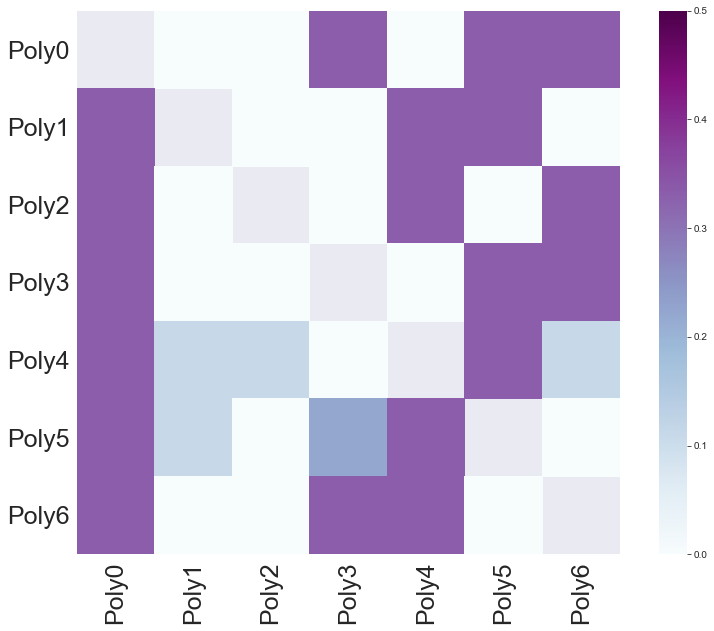

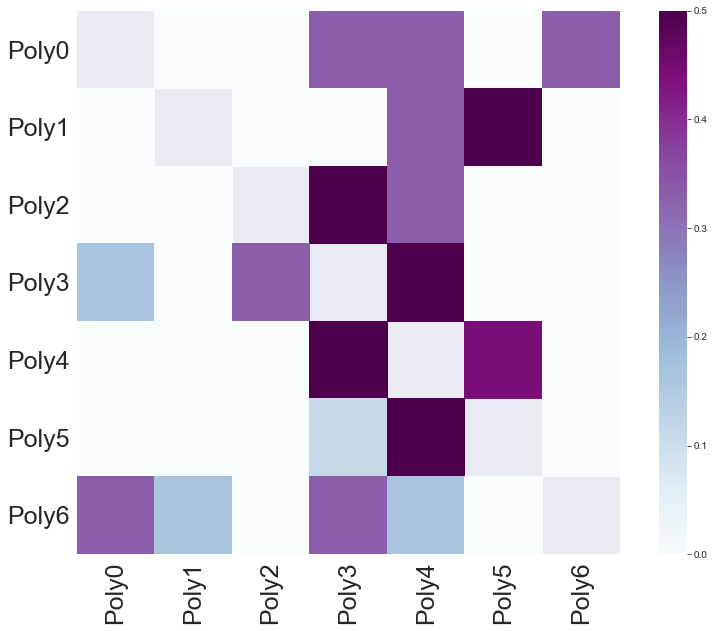

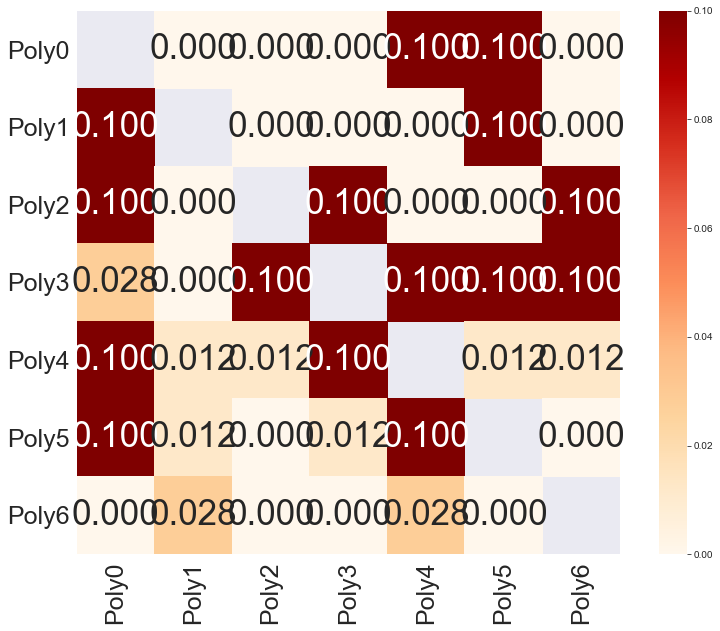

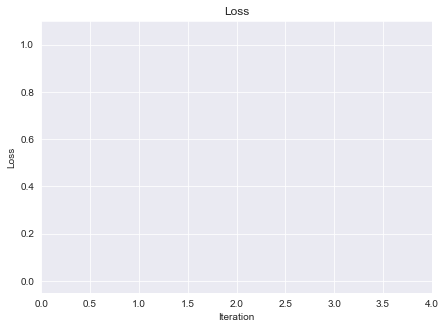

In [12]:
umap_cp.show_polygons=True
umap_cp.alpha = [0.1] * 7
umap_cp.douglas_peucker_tolerance = 0.1
umap_cp.remove_outliers_k = 150
umap_cp.show_points = False
umap_cp.anchors_plot_sns_separate(1, True)

# PCA

In [18]:
pca_cp = ClusterPlot(dim_reduction_algo='pca',
            reduce_all_points=True,
            n_iter=1, 
            batch_size=0,
            learning_rate=0.1,
            do_animation=False,
            dataset='Hourglass2',
            class_to_label=ds.class_to_label,
            show_fig=True,
            save_fig=True,
            random_state=RANDOM_STATE,
            show_anchors=False,
            supervised=False,
            show_points=True,
            show_inner_blobs=False,
            show_polygons=False,
            show_label_level_plots=True,
            show_anchor_level_plot=False,
            annotate_images=False,
            birch_threshold=0.55,)
print(pca_cp)

AMAP
addr:@145f08
verbose=True
n_components=2
anchors_method='birch'
n_intra_anchors=None
birch_threshold=0.55
birch_branching_factor=None
dim_reduction_algo='pca'
supervised=False
umap_n_neighbors=15
umap_min_dist=1
reduce_all_points=True
uniform_points_per='anchor'
k=20
proximity_k=3
self_relation=False
radius_q=None
do_relaxation=True
top_greedy=1
magnitude_step=False
n_iter=1
batch_size=0
stop_criteria=1e-05
loss_func=<function AMAP.l_inf_loss at 0x000002645029E438>
loss='Linf'
only_inter_relations=False
learning_rate=0.1
mask_sparse_subcluster=None
random_points_method='voronoi'
class_to_label={0: 'Poly0', 1: 'Poly1', 2: 'Poly2', 3: 'Poly3', 4: 'Poly4', 5: 'Poly5', 6: 'Poly6'}
random_state=42
n_jobs=None
dataset='Hourglass2'
show_fig=True
save_fig=True
is_plotly=False
do_animation=False
use_spline=False
alpha=None
douglas_peucker_tolerance=0.6
smooth_iter=13
skip_polygons_with_area=0.01
show_relations=False
mask_relation_in_same_label=False
save_fig_every=1
show_points=True
show_a

finding intra class anchors using birch
UnSupervised Dim Reduction
Dim Reduction all points
Starting iteration 1 loss = 0.8729246487867178


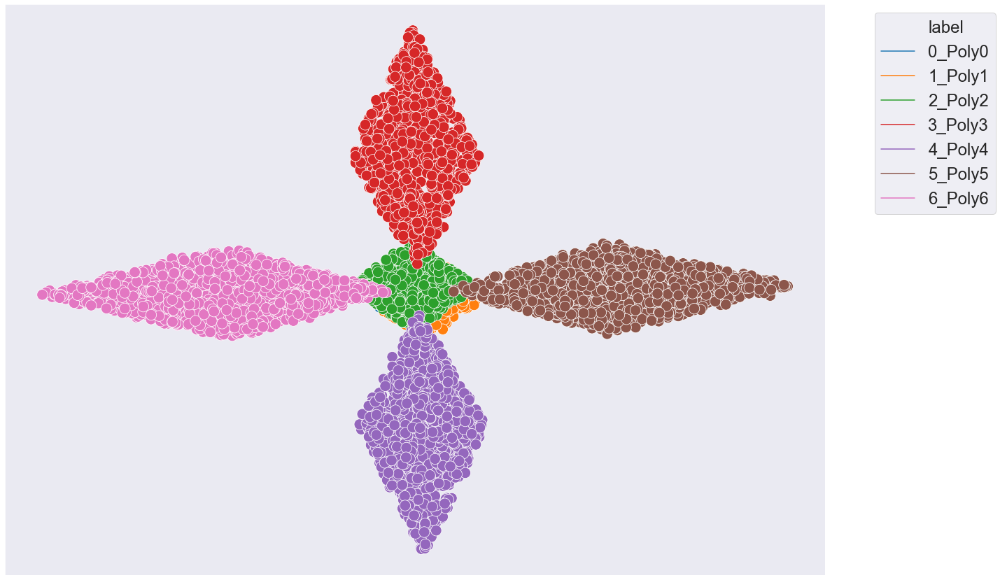

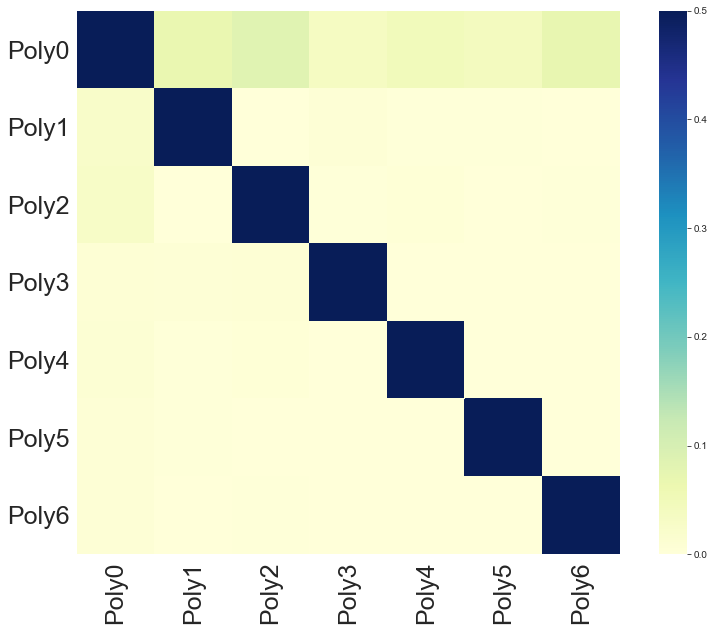

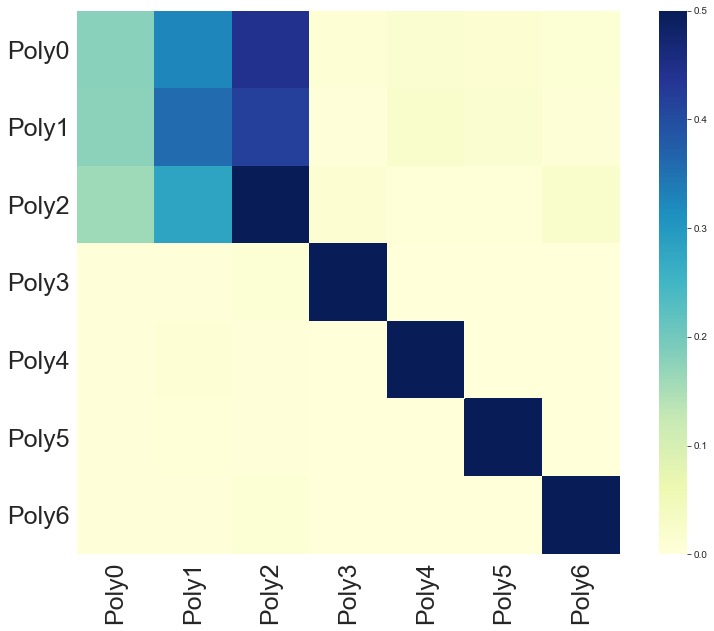

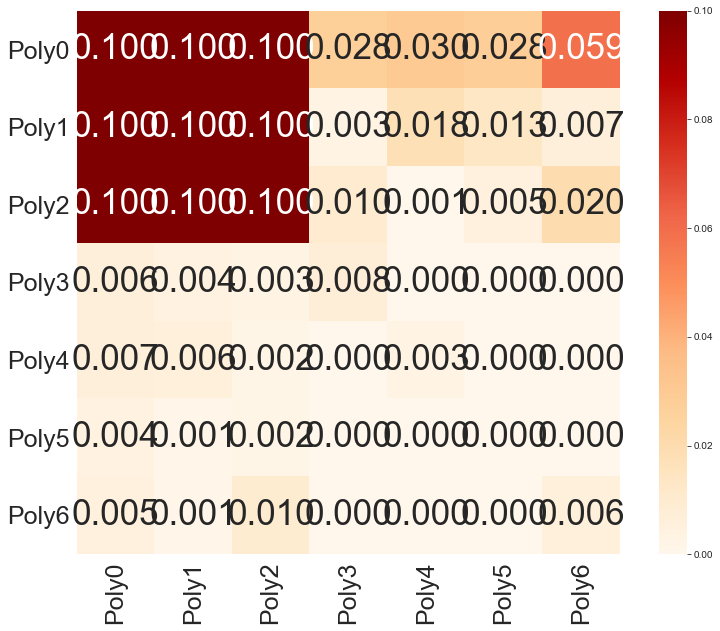

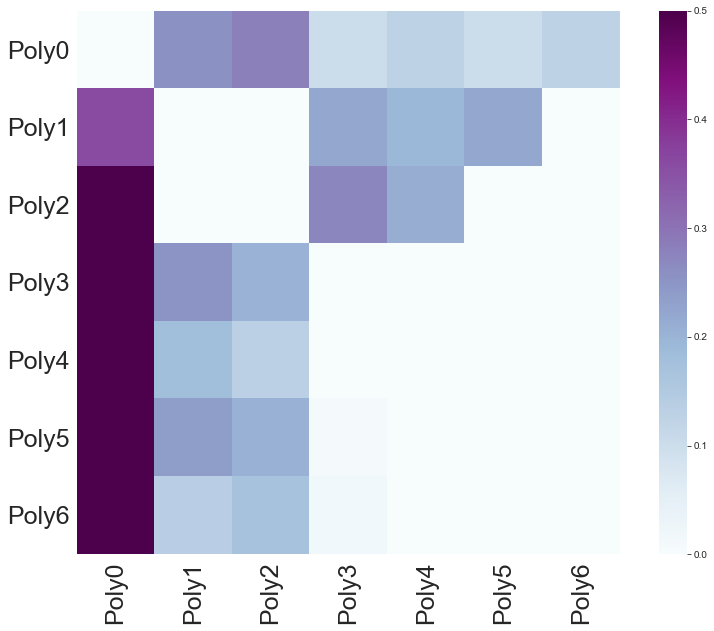

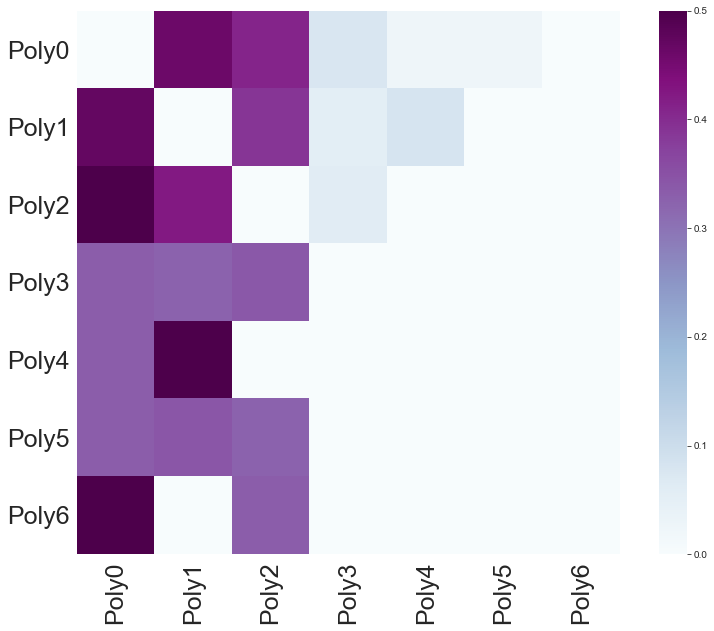

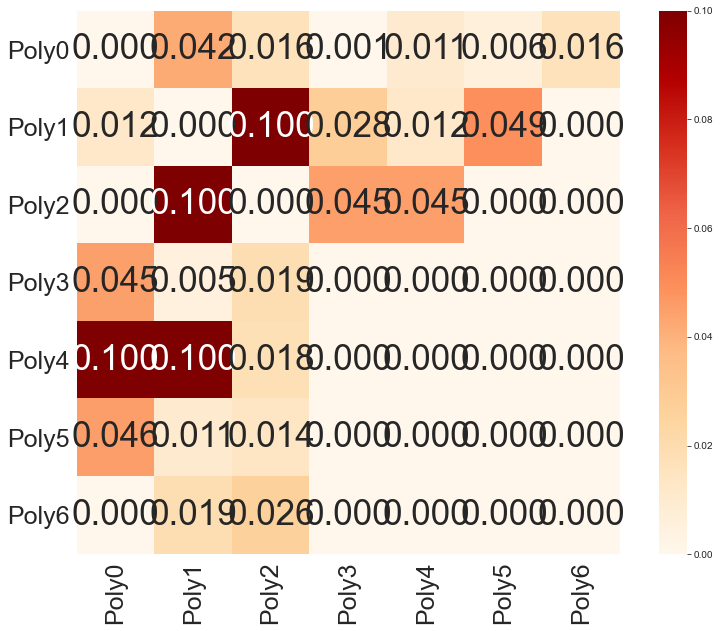

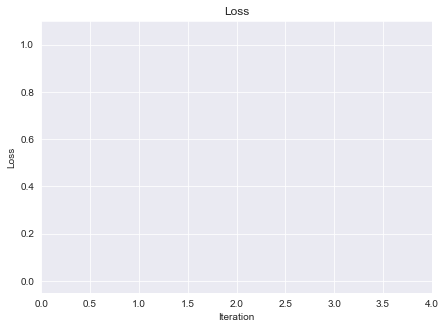

In [19]:
low_dim_pca = pca_cp.fit_transform(X, y)

# BIRCH and UMAP

In [12]:
birch_umap_cp = ClusterPlot(reduce_all_points=False,
                  n_iter=1, 
                  batch_size=0,
                  learning_rate=0.1,
                  dataset='Hourglass2',
                  class_to_label=ds.class_to_label,
                  show_fig=True,
                  save_fig=True,
                  random_state=RANDOM_STATE,
                  show_anchors=True,
                  supervised=False,
                  show_points=False,
                  show_inner_blobs=False,
                  show_polygons=False,
                  show_label_level_plots=True,
                  show_anchor_level_plot=False,
                  save_fig_every=25,
                  annotate_images=False,
                  birch_threshold=0.42,
                  alpha=0.8,
                  douglas_peucker_tolerance=0.3,
                  smooth_iter=3,
                  magnitude_step=False)
print(birch_umap_cp)

AMAP
addr:@689808
verbose=True
n_components=2
anchors_method='birch'
n_intra_anchors=None
birch_threshold=0.42
birch_branching_factor=None
dim_reduction_algo='umap'
supervised=False
umap_n_neighbors=15
umap_min_dist=1
reduce_all_points=False
uniform_points_per='anchor'
k=20
proximity_k=3
self_relation=False
radius_q=None
do_relaxation=True
top_greedy=1
magnitude_step=False
n_iter=1
batch_size=0
stop_criteria=1e-05
loss_func=<function AMAP.l_inf_loss at 0x000002645029E438>
loss='Linf'
only_inter_relations=False
learning_rate=0.1
mask_sparse_subcluster=None
random_points_method='voronoi'
class_to_label={0: 'Poly0', 1: 'Poly1', 2: 'Poly2', 3: 'Poly3', 4: 'Poly4', 5: 'Poly5', 6: 'Poly6'}
random_state=42
n_jobs=None
dataset='Hourglass2'
show_fig=True
save_fig=True
is_plotly=False
do_animation=False
use_spline=False
alpha=0.8
douglas_peucker_tolerance=0.3
smooth_iter=3
skip_polygons_with_area=0.01
show_relations=False
mask_relation_in_same_label=False
save_fig_every=25
show_points=False
show

finding intra class anchors using birch
UnSupervised Dim Reduction
Dim Reduction only anchors
Dim Reduction only anchors - generate random points in low dim per anchor


100%|█████████████████████████████████████████████████████████████████████████████| 5960/5960 [00:23<00:00, 253.98it/s]


Starting iteration 1 loss = 0.9473684210526315


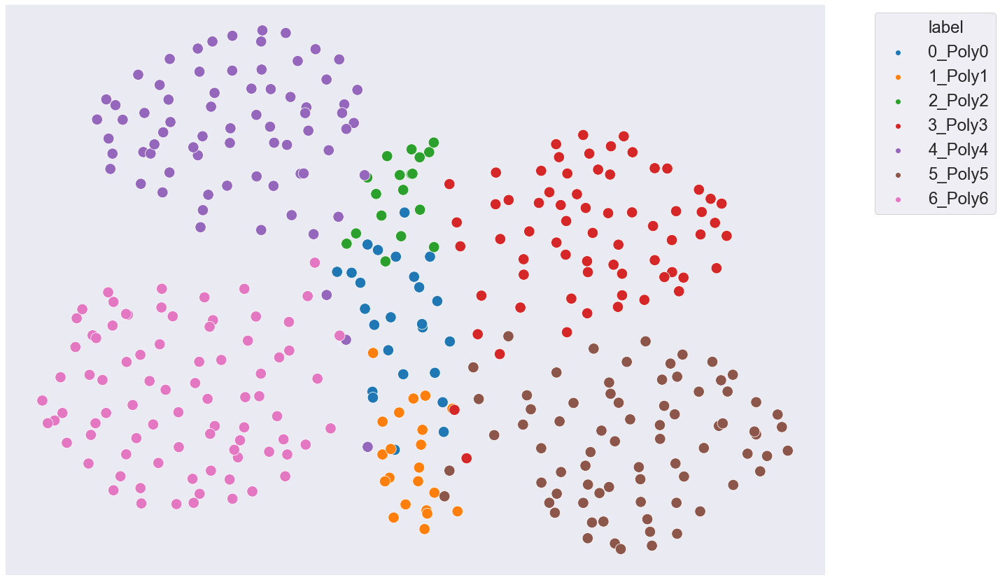

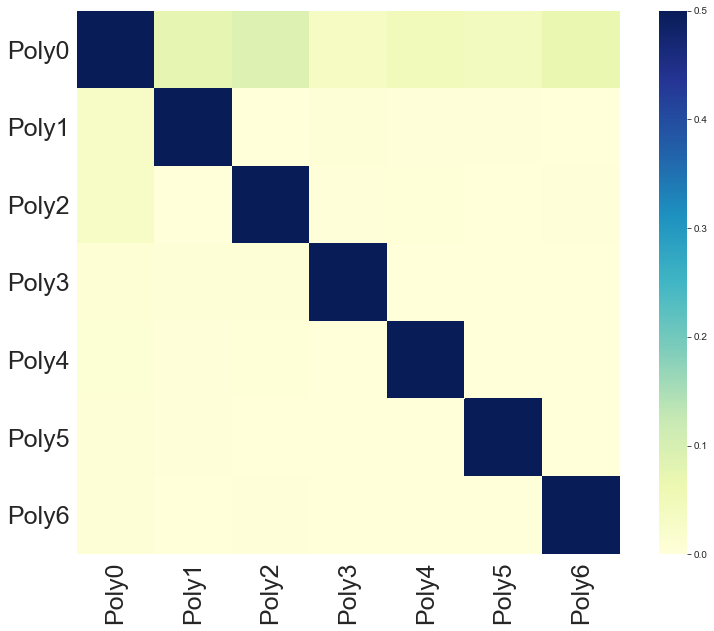

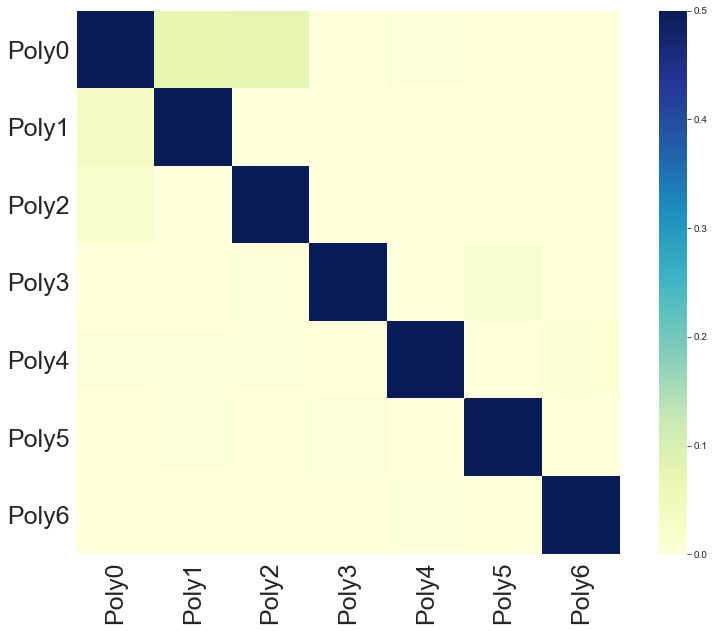

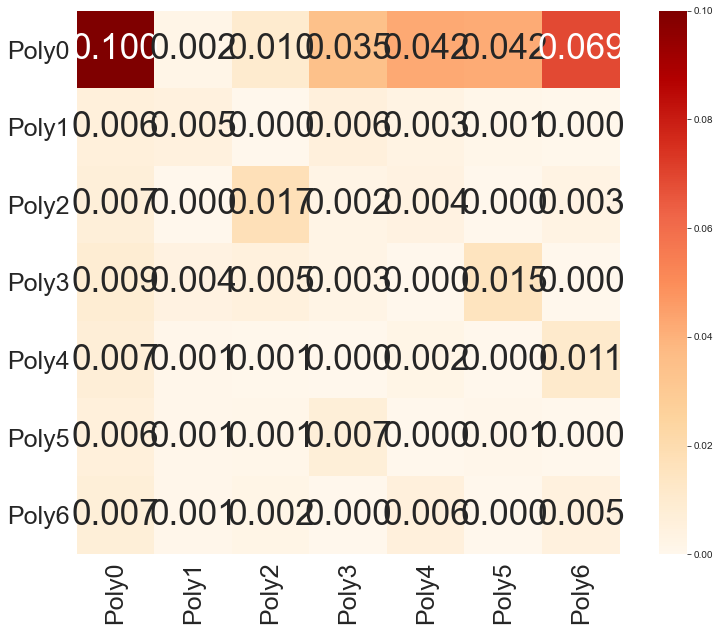

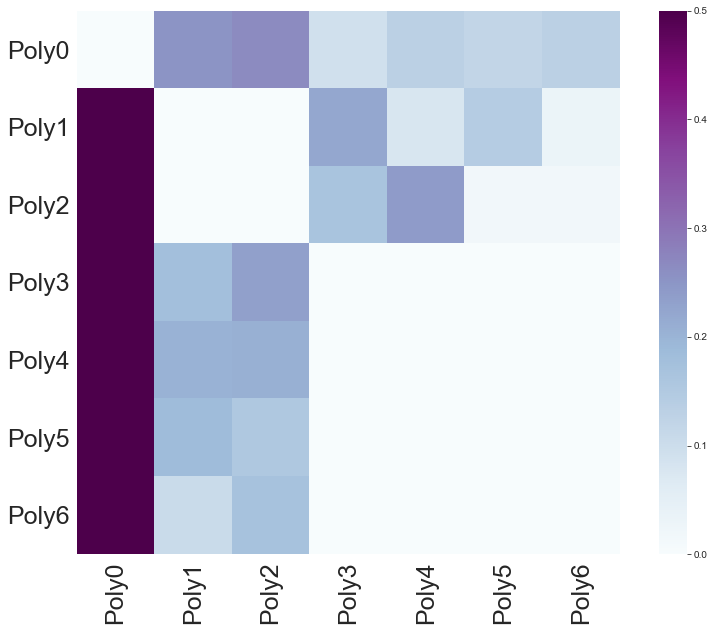

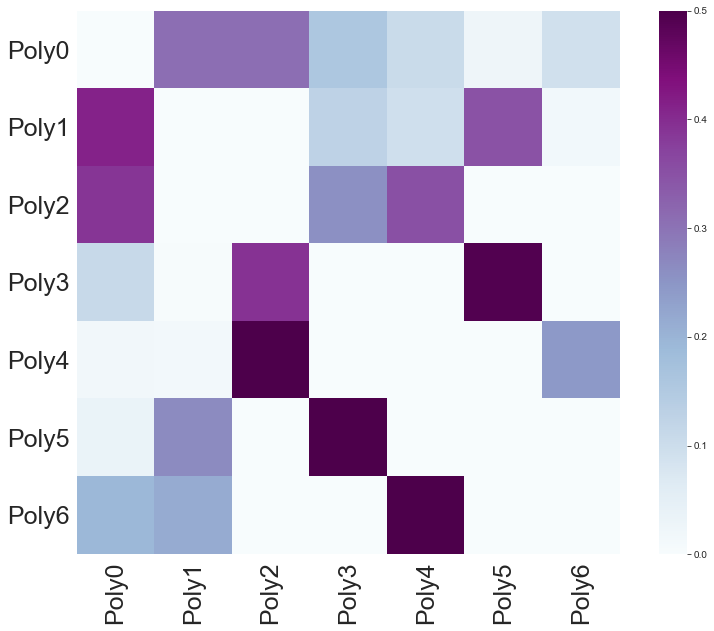

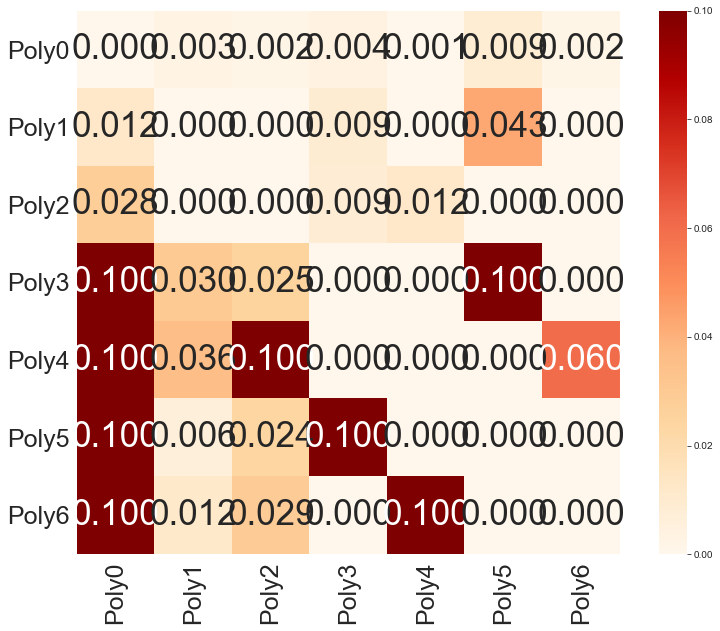

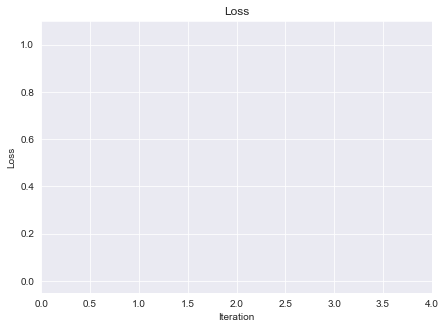

In [13]:
birch_umap_low_dim = birch_umap_cp.fit_transform(X, y)

# Cluster Plots

In [7]:
blobs_cp = ClusterPlot(reduce_all_points=False,
                  n_iter=1, 
                  batch_size=0,
                  learning_rate=0.1,
                  dataset='Cross',
                  class_to_label=ds.class_to_label,
                  show_fig=True,
                  save_fig=True,
                  random_state=RANDOM_STATE,
                  show_anchors=False,
                  supervised=False,
                  show_points=False,
                  show_inner_blobs=True,
                  show_polygons=True,
                  show_label_level_plots=True,
                  show_anchor_level_plot=False,
                  save_fig_every=25,
                  annotate_images=False,
                  birch_threshold=0.42,
                  alpha=0.2,
                  douglas_peucker_tolerance=0.5,
                  smooth_iter=3,
                  magnitude_step=False)
print(blobs_cp)

AMAP
addr:@323f88
verbose=True
n_components=2
anchors_method='birch'
n_intra_anchors=None
birch_threshold=0.42
birch_branching_factor=None
dim_reduction_algo='umap'
supervised=False
umap_n_neighbors=15
umap_min_dist=1
reduce_all_points=False
uniform_points_per='anchor'
k=20
proximity_k=3
self_relation=False
radius_q=None
do_relaxation=True
top_greedy=1
magnitude_step=False
n_iter=1
batch_size=0
stop_criteria=1e-05
loss_func=<function AMAP.l_inf_loss at 0x0000020464136DC8>
loss='Linf'
only_inter_relations=False
learning_rate=0.1
mask_sparse_subcluster=None
random_points_method='voronoi'
class_to_label={0: 'Poly0', 1: 'Poly1', 2: 'Poly2', 3: 'Poly3', 4: 'Poly4', 5: 'Poly5', 6: 'Poly6'}
random_state=42
n_jobs=None
dataset='Cross'
show_fig=True
save_fig=True
is_plotly=False
do_animation=False
use_spline=False
alpha=0.2
douglas_peucker_tolerance=0.5
smooth_iter=3
skip_polygons_with_area=0.01
mask_relation_in_same_label=True
save_fig_every=25
show_points=False
show_anchors=False
show_polygon

finding intra class anchors using birch
UnSupervised Dim Reduction
Dim Reduction only anchors
Dim Reduction only anchors - generate random points in low dim per anchor


100%|████████████████████████████████████████████████████████████████████████████| 14384/14384 [04:49<00:00, 49.71it/s]


Starting iteration 1 loss = 0.8421052631578947
ROTATING!!!!
ROTATING!!!!
ROTATING!!!!
ROTATING!!!!
ROTATING!!!!
ROTATING!!!!
ROTATING!!!!
ROTATION NO XLIM


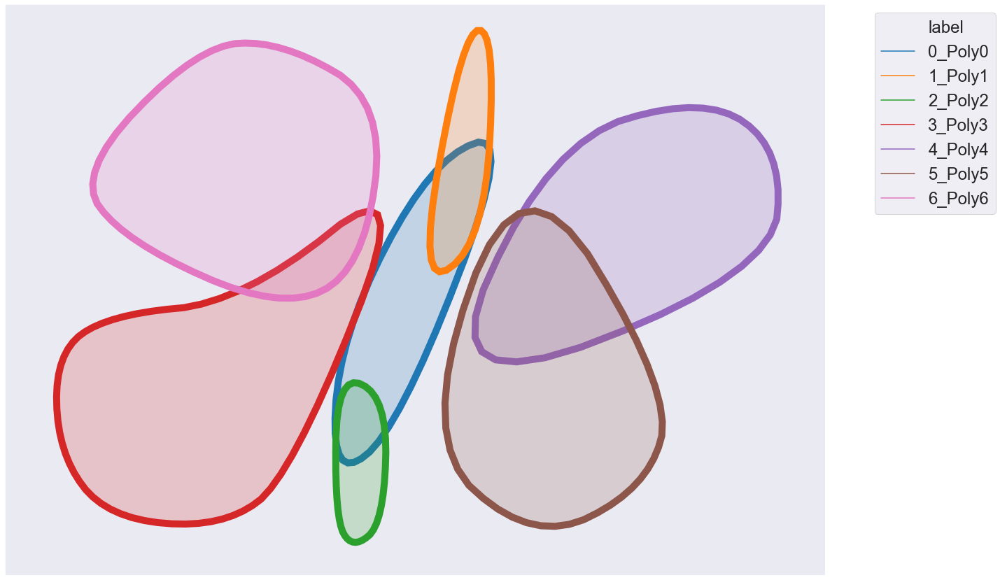

ROTATING!!!!
ROTATING!!!!
ROTATING!!!!
ROTATING!!!!
ROTATING!!!!
ROTATING!!!!
ROTATING!!!!
ROTATION NO XLIM


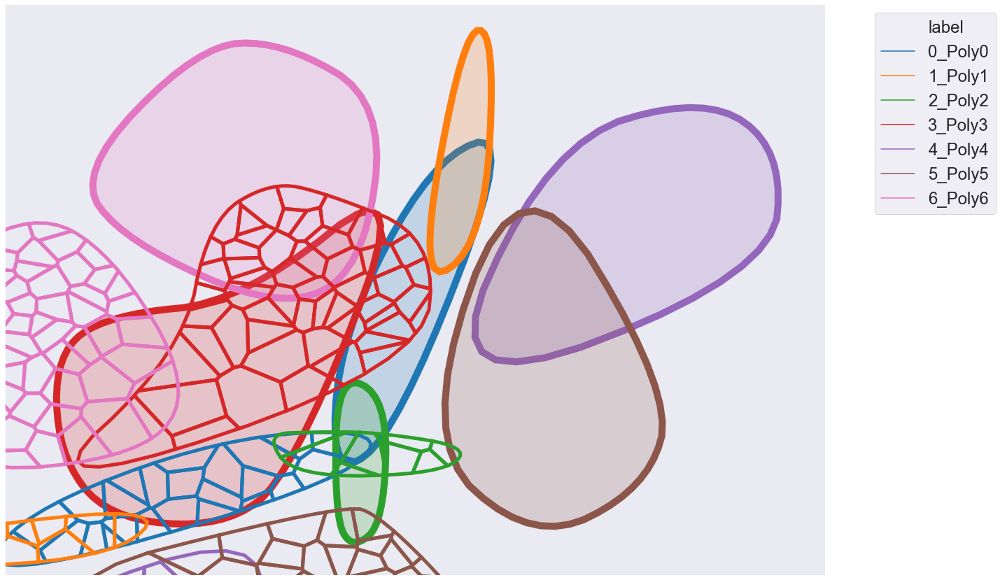

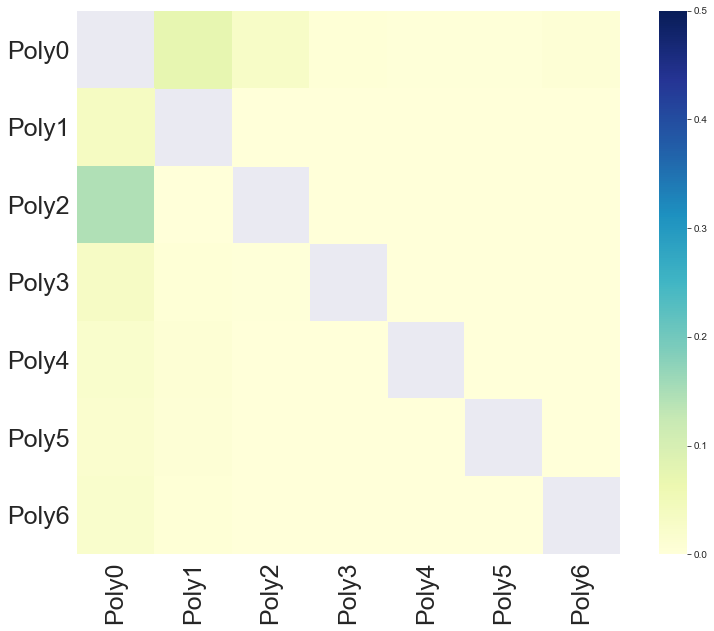

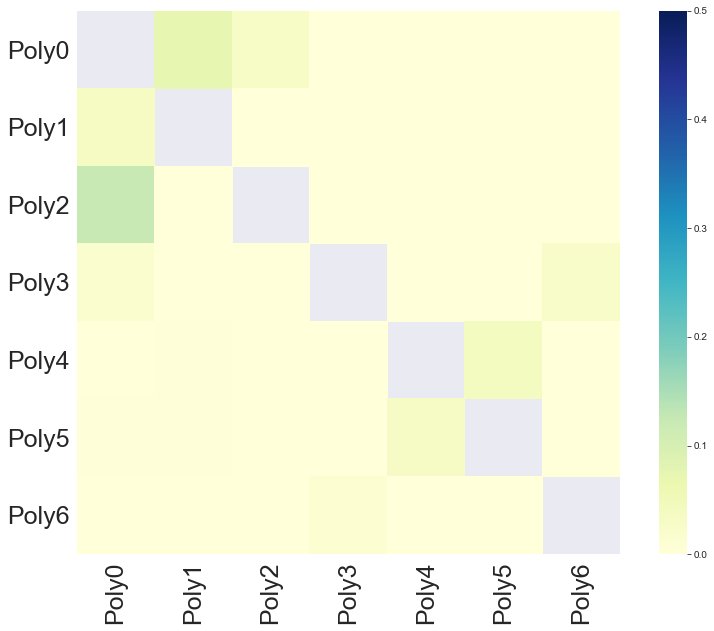

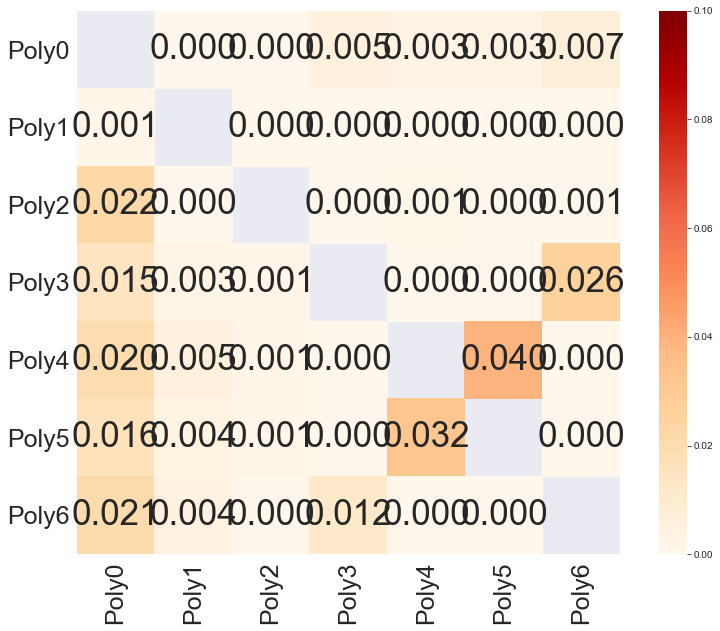

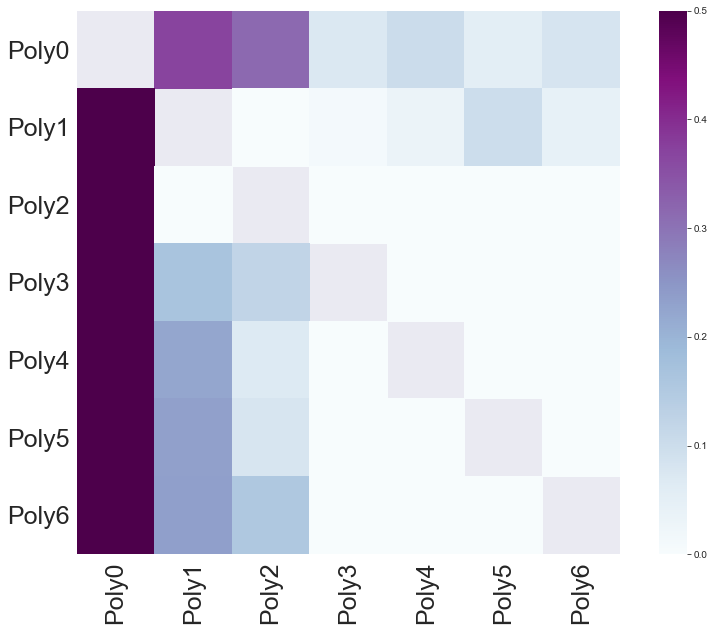

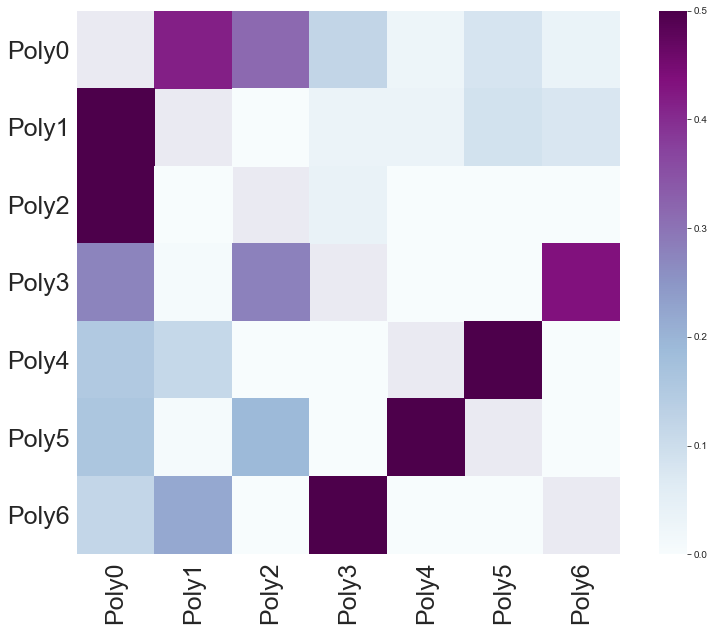

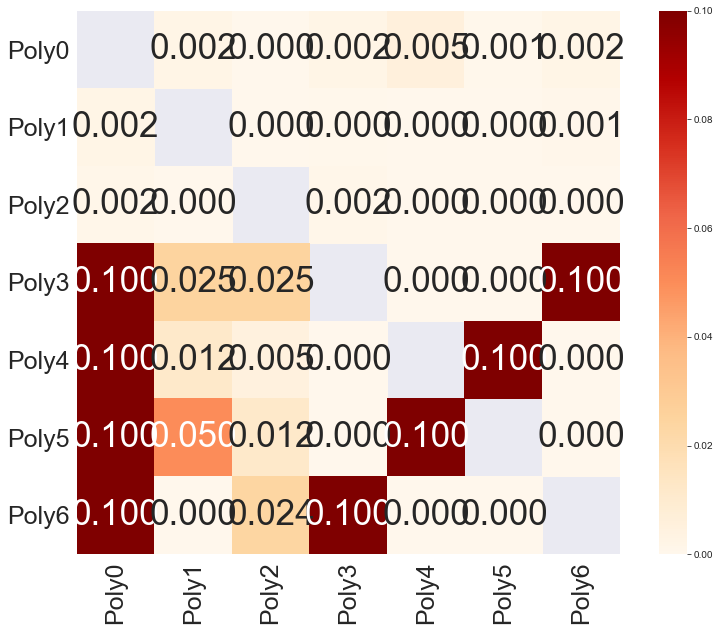

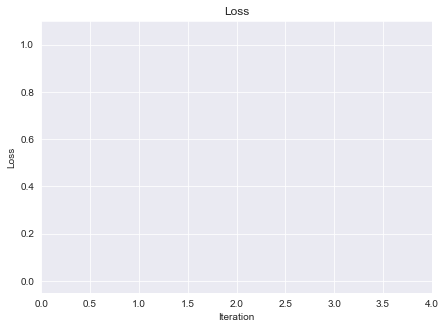

In [8]:
low_dim_blobs_cp = blobs_cp.fit_transform(X, y)